# Script Generation and Divison into Scenes


In [2]:
import os
import re
import json
from tqdm import tqdm
from openai import OpenAI

OPENAI_API = "" #@param {type:"string"}
GEMINI_API = "" #@param {type:"string"}

os.environ["GEMINI_API_KEY"] = ""
client = OpenAI(api_key=OPENAI_API)

story_expansion_prompt = """
You are a precise, visual, and humorous story expander for a storyboard generator about **Aldar Köse**,
the legendary Kazakh folk trickster known for his cleverness, humor.

Your task is to take a short 2–4 sentence idea and expand it into a **detailed, coherent, and short story (300 words)**
that clearly unfolds across **6–10 visually distinct scenes**.
The story should be easy to follow **by visuals alone**, so each moment can be understood without narration.
---

### 🌍 WORLD RULES (Global Consistency)
1. Default environment: the Kazakh steppe in ancient times.
   - Flat terrain, short green grass.
   - Blue sky with many clouds.
   - It is midday, sunny, and calm (no wind).
   - A traditional yurt is always present unless explicitly told otherwise.
   - No rivers, trees, or animals unless explicitly required by the prompt.

2. Style:
   - Cultural look.
   - Consistent vivid color palette across all frames.
   - Clear, sharp imagery, medium or high contrast.
   - Same lighting and tone throughout.

3. Default camera: full body framing for Aldar Köse, unless original prompt says otherwise.

---

### 🧔 CHARACTER RULES
- **Aldar Köse**:
- A clever, funny Kazakh man with short dark hair, a small top tuft, lively eyes, and a round face.
- Wears a light brown patched *chapan* (traditional robe) tied with a simple belt.
- Often carries a small sack or sometimes rides a donkey.
- Personality: cheerful, cunning, defends the poor, tricks the greedy, teaches a moral lesson in the end.
- Must look **identical across all scenes**.

- **Other characters** (if appear):
  - Belong to ancient Kazakh folklore and are in the same style as Aldar Kose.
  - Wear culturally appropriate clothing for their status and wealth.
  - Consistent appearance and personality across all frames.

---

### 🎯 TASK

- Expand the short 2–4 sentence summary into a full story of 6–10 logical actions/events.
- Keep cultural and historical authenticity.
- Describe clearly what happens and what Aldar Köse feels or plans.
- The story must be **fully understandable by looking at the generated images alone**, with each scene containing clear visual cues of cause and effect.


Return the story as plain text (no lists, no numbering).
"""

def expand_to_story(logline: str):
    response = client.chat.completions.create(
        model="gpt-4o-mini",
        messages=[
            {"role": "system", "content": story_expansion_prompt},
            {"role": "user", "content": logline}
        ],
        temperature=0.7,
        max_tokens=1200
    )
    return response.choices[0].message.content.strip()

story_to_scenes_prompt = """
You are a precise scene segmentation model for a storyboard generator based on ancient Kazakh folklore.

Your task is to take a detailed story about Aldar Köse and divide it into 6–10 visual frames.
Each frame must represent one key moment that can be shown as a single image.

---

### 🧭 GLOBAL CONSTANTS
1. Environment: Kazakh steppe, midday, sunny, calm, short green grass, blue sky with clouds.
   A single yurt is visible unless the story removes it.
2. Aldar Köse’s appearance is fixed: Kazakh man, brown chapan, fur hat,
   clever kind smile, sometimes with a donkey or sack.
3. Other characters keep identical appearance across all frames.

---

### 🎬 EACH FRAME MUST INCLUDE:
- caption (short title)
- prompt (very detailed text for image generation)
- environment (location, time, weather, background)
- characters (with consistent visual details)
- emotion (emotional tone)
- camera (angle or framing)
- neg (list of negative keywords for image generation)

---

### 🧾 OUTPUT FORMAT
Output STRICT valid JSON array like this:

[
  {
    "scene_id": 1,
    "caption": "Aldar Köse rides through the Kazakh steppe.",
    "prompt": "Full-body shot of Aldar Köse, Kazakh man, brown chapan, and fur hat. He rides a donkey across the flat green steppe under blue sky with white clouds. A single yurt stands in the background. Lighting: bright midday sun, calm air, vivid colors. Historical realism, consistent style, no filter.",
    "environment": "Kazakh steppe, midday, sunny, calm, yurt visible.",
    "characters": {
      "aldar_kose": "Kazakh young man, he wears a light brown patched chapan (traditional robe) tied with a simple belt.",
      "others": "none"
    },
    "emotion": "calm confidence, peaceful travel mood",
    "camera": "full-body shot, eye-level, classical composition",
    "neg": "blurry, inconsistent face, artistic filter, low quality, extra limbs"
  }
]
Return ONLY valid JSON, no commentary, no markdown.
"""

def story_to_scenes(story: str, num_scenes: int = 8):
    prompt = story_to_scenes_prompt + "\n\nSTORY:\n" + story
    response = client.chat.completions.create(
        model="gpt-4o-mini",
        messages=[{"role": "user", "content": prompt}],
        temperature=0.6,
        max_tokens=2000
    )
    raw = response.choices[0].message.content.strip()

    try:
        scenes = json.loads(raw)
    except json.JSONDecodeError:
        cleaned = re.sub(r"```json|```", "", raw)
        cleaned = re.sub(r"^[^[]*?(\[)", r"\1", cleaned, flags=re.S)
        cleaned = re.sub(r"(\])[^]]*$", r"\1", cleaned, flags=re.S)
        cleaned = cleaned.strip()
        scenes = json.loads(cleaned)
    with open("index.json", "w", encoding="utf-8") as f:
        json.dump(scenes, f, ensure_ascii=False, indent=2)
    print(f"✅ index.json created with {len(scenes)} frames.")
    return scenes

def make_index_json(scenes, output_path="index.json"):
    with open(output_path, "w", encoding="utf-8") as f:
        json.dump(scenes, f, ensure_ascii=False, indent=2)
    print(f"📁 index.json saved ({len(scenes)} frames).")
    return scenes

def generate_storyboard_structure(logline: str, num_scenes: int = 8):
    print("🪶 Expanding story...")
    story = expand_to_story(logline)
    print("📖 FULL EXPANDED STORY:\n")
    print(story)
    print("\n──────────────────────────────\n")

    print("🎬 Splitting story into scenes...")
    scenes = story_to_scenes(story, num_scenes=num_scenes)
    print(f"✅ {len(scenes)} scenes generated.\n")

    print("📘 STORYBOARD JSON (PREVIEW):\n")
    print(json.dumps(scenes, ensure_ascii=False, indent=2))

    index = make_index_json(scenes)
    print("\n✅ Storyboard generation completed.")
    print("You can now use index.json for image generation.\n")
    return story, scenes, index

logline = "\"Aldar Köse rests near his yurt at midday. He smiles, thinking of his next adventure in the vast Kazakh steppe.\"" #@param {type:"string"}

story, scenes, index = generate_storyboard_structure(logline)

print("\nFinal Story:\n", story)
print("\nFinal Scenes:\n", json.dumps(scenes, ensure_ascii=False, indent=2))


🪶 Expanding story...
📖 FULL EXPANDED STORY:

Aldar Köse sits comfortably in the shade of his vibrant yurt, a smile dancing across his face as he gazes out over the endless Kazakh steppe. The sun shines brightly, casting playful shadows on the ground, and he taps a finger rhythmically on his knee, plotting his next clever trick. 

In the next scene, he stands up, his eyes sparkling with mischief as he grabs his small sack and dons his light brown patched chapan. He waves to a group of wealthy merchants passing by on horseback, their lavish clothing and arrogant expressions evident. Aldar's smile widens; he sees an opportunity.

The scene transitions to Aldar approaching the merchants, who are busy boasting about their riches. He introduces himself with a theatrical bow, claiming to possess a magical treasure hidden in the steppe. The merchants lean in with intrigue, their eyes gleaming with greed.

Next, Aldar leads them to a grassy hill, gesturing dramatically as he explains the treasu

# Image Generation

🎞 6 frames loaded.



🎨 Generating frames:  17%|█▋        | 1/6 [00:08<00:42,  8.54s/it]

✅ Saved: /content/results/frame_01.png — Aldar Köse relaxes in the shade of his yurt.


🎨 Generating frames:  33%|███▎      | 2/6 [00:20<00:42, 10.55s/it]

✅ Saved: /content/results/frame_02.png — Aldar Köse prepares for mischief.


🎨 Generating frames:  50%|█████     | 3/6 [00:31<00:32, 10.80s/it]

✅ Saved: /content/results/frame_03.png — Aldar Köse captivates the merchants.


🎨 Generating frames:  67%|██████▋   | 4/6 [00:42<00:22, 11.03s/it]

✅ Saved: /content/results/frame_04.png — The promise of treasure.


🎨 Generating frames:  83%|████████▎ | 5/6 [00:52<00:10, 10.66s/it]

✅ Saved: /content/results/frame_05.png — The comical tumble.


🎨 Generating frames: 100%|██████████| 6/6 [01:02<00:00, 10.40s/it]

✅ Saved: /content/results/frame_06.png — Aldar Köse teaches a lesson.

🎉 All frames generated successfully! Saved in /outputs/


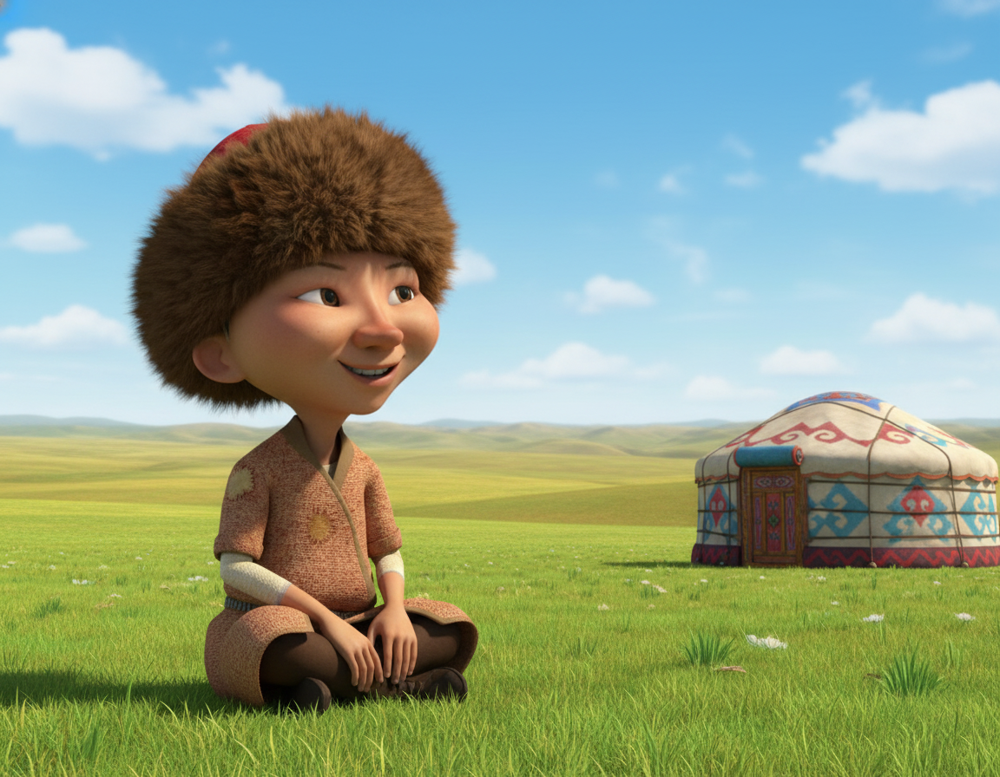

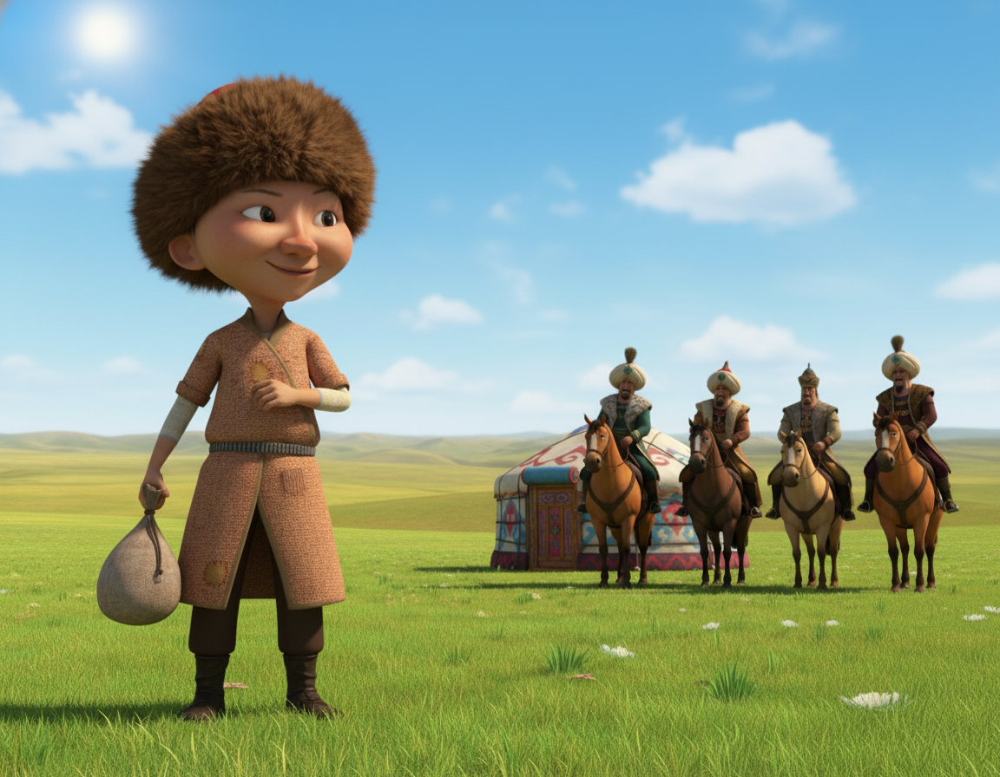

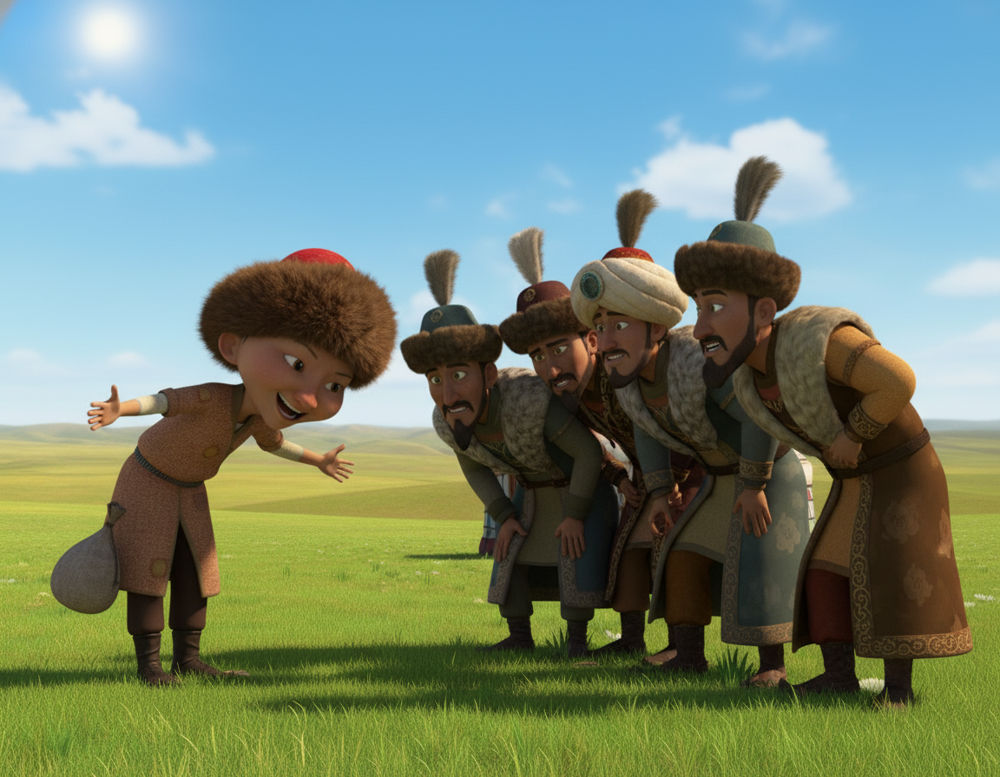

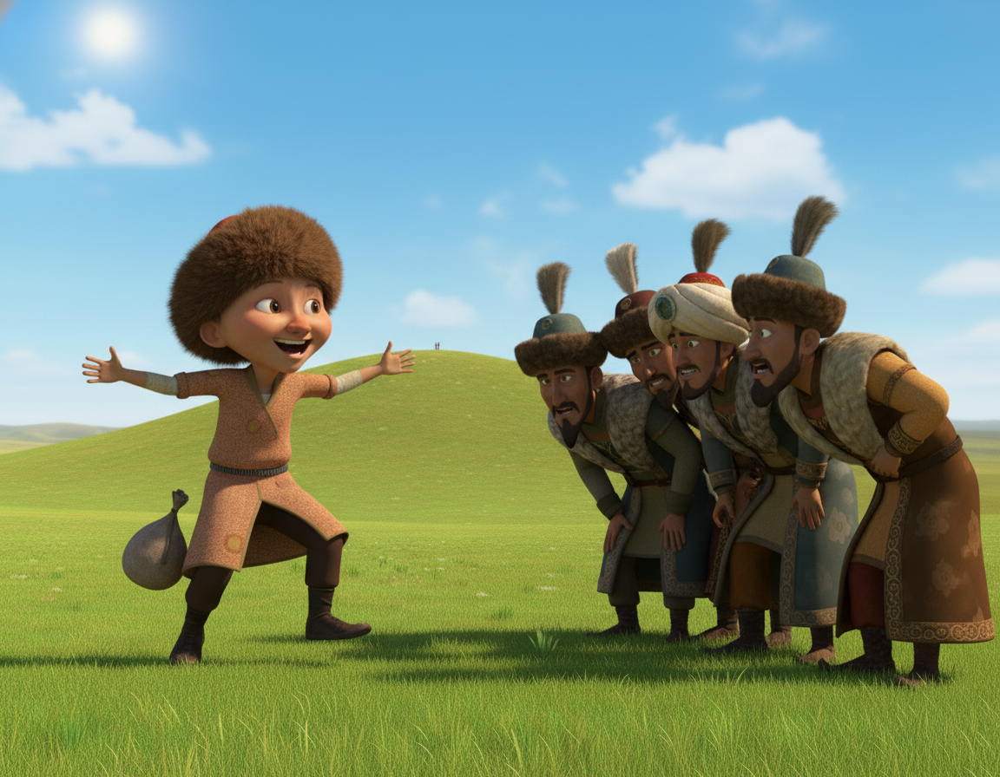

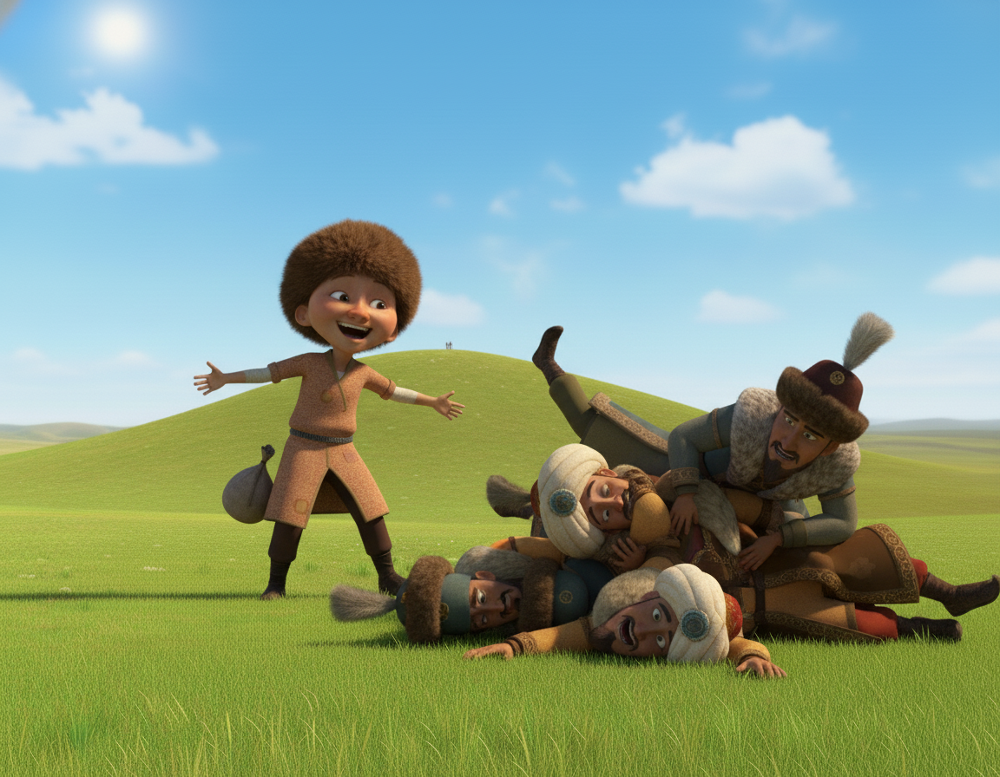

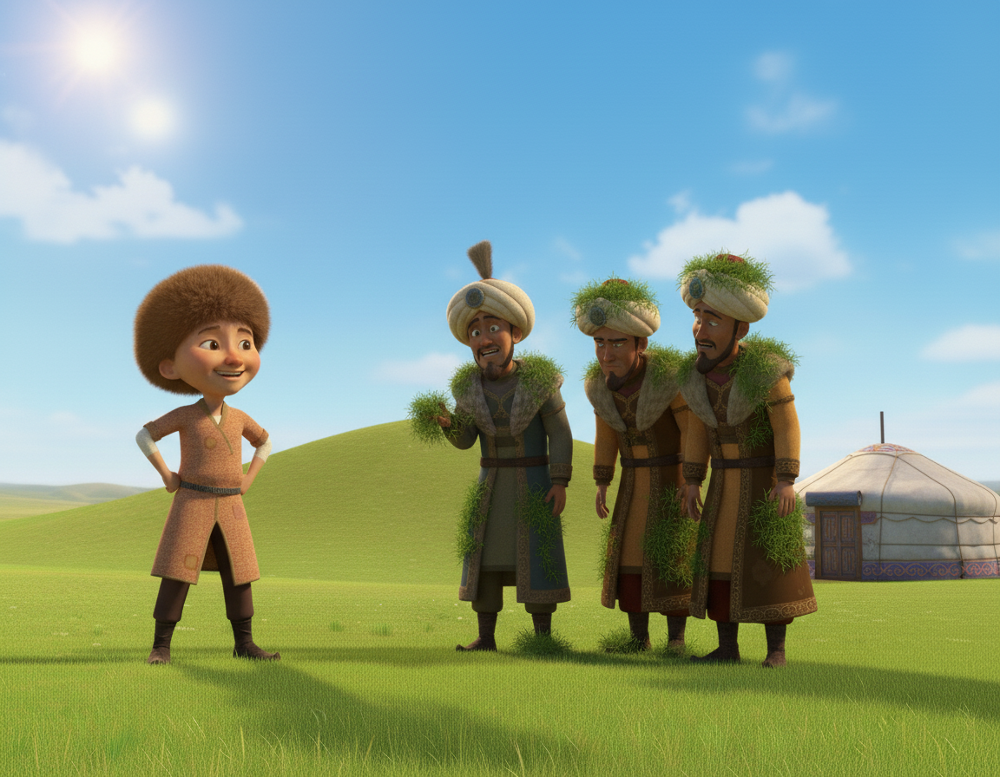

In [6]:
# @title
!mkdir results
import json
import os
from PIL import Image
from IPython.display import Image as IPImage, display
from tqdm import tqdm
from google import genai
from PIL import Image
from io import BytesIO
import os


client = genai.Client()

ref_image = Image.open('ref_images/1.png')

def generate_images_from_json(json_path="index.json"):

    with open(json_path, "r", encoding="utf-8") as f:
        scenes = json.load(f)
    print(f"🎞 {len(scenes)} frames loaded.\n")

    for scene in tqdm(scenes, desc="🎨 Generating frames"):
        sid = scene.get("scene_id", 0)
        caption = scene.get("caption", "")
        prompt = scene.get("prompt", "")
        neg = scene.get("neg", "low quality, inconsistent, cartoon, blur")

        if sid == 1:
            text_input = """Use the provided image of a Aldar Kose as reference image how my character must and only look like. Generate """ + prompt
            response = client.models.generate_content(
                model="gemini-2.5-flash-image",
                contents=[text_input, ref_image],
            )
        else:
            ctx = Image.open(f"results/frame_{sid -1:02}.png")
            text_input = f"""Use the provided image as a context of what happened in previous scene. Generate """ + prompt
            response = client.models.generate_content(
                model="gemini-2.5-flash-image",
                contents=[text_input, ctx],
            )


        image_parts = [
            part.inline_data.data
            for part in response.candidates[0].content.parts
            if part.inline_data
        ]

        path = f"/content/results/frame_{sid:02}.png"

        if image_parts:
            image = Image.open(BytesIO(image_parts[0]))
            image.save(path)
            image.show()

        print(f"✅ Saved: {path} — {caption}")


    print("\n🎉 All frames generated successfully! Saved in /outputs/")

    for i in range(1, len(scenes) + 1):
        display(IPImage(filename=f"/content/results/frame_{i:02}.png"))

if __name__ == "__main__":
    generate_images_from_json("index.json")